# Desarrollo Proyecto Final - Minería de Datos #

#### Juan Pablo Garzón Rivera - David Santiago Pérez Barrios - Yeferson Fabian Rubio Montero

## Procesamiento de Imágenes (Reconocimiento Facial) 

En este estudio, la detección de rostros se realizó a partir de las imágenes del conjunto de datos LFW.

Antes de la detección de rostros en imágenes LFW, la detección de rostros múltiples se realiza en imágenes individuales.

El número deseado de imágenes se toma del archivo zip en el conjunto de datos LFW. Luego, la detección de rostros se realizó a partir de estas imágenes.

In [42]:
import numpy as np # Algebra Lineal
import pandas as pd # Procesamiento de Datos p.e. archivos CSV

# Visualización
import matplotlib.pyplot as plt

# Procesamiento de Imágenes
import cv2

# Extracción de archivos comprimidos
import tarfile

# Sistemas (Abrir direcciones)
import os
# print(os.listdir("D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/data/haarcascades"))
# print(os.listdir("D:/Proyecto_Mineria/Proyecto/lfw"))

## Creación de la clase para detectar rostro

In [17]:
# Creación de función para identificar las coordenadas del rostro dada una imágen #

class FaceDetector():

    def __init__(self,faceCascadePath):
        self.faceCascade=cv2.CascadeClassifier(faceCascadePath)


    def detect(self, image, scaleFactor=1.1,
               minNeighbors=5,
               minSize=(30,30)):
        
        # La función devuelve el rectangulo con las coordenadas en la cara para una imágen dada 
        rects=self.faceCascade.detectMultiScale(image,
                                                scaleFactor=scaleFactor,
                                                minNeighbors=minNeighbors,
                                                minSize=minSize)
        return rects

Un archivo con la extensión .xml consiste en un archivo de lenguaje marcado extensible (XML), el cual consiste en un archivo de texto sin formato que utiliza una serie de etiquetas personalizadas con la finalidad de describir tanto la estructura como otras características del documento. [Fuente](https://www.muyinteresante.es/tecnologia/articulo/que-es-y-como-abrir-un-archivo-xml-201608322902)

In [18]:
# Se carga archivo: "Frontal face of haar cascade"
frontal_cascade_path="D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/data/haarcascades/haarcascade_frontalface_default.xml"

# Se crea el objeto que permite detectar el rostro
fd=FaceDetector(frontal_cascade_path)

In [73]:
# Cargamos un ejemplos con imágen que contiene rostros
Trabajo = cv2.imread("D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/samples/winrt/FaceDetection/FaceDetection/Assets/group1.jpg")
Futbol = cv2.imread("D:/Proyecto_Mineria/Proyecto/Extras/Real_Madrid.jpg")

## Detección de rostros en Imagenes tomadas 

In [74]:
def Foto_Trabajo():
    return np.copy(Trabajo)

def Foto_Real():
    return np.copy(Futbol)

def show_image(image):
    plt.figure(figsize=(18,15))
    # Antes de mostrar la imágen, se cambia el orden del color de BGR a RGB
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([])
    plt.yticks([])
    plt.show()

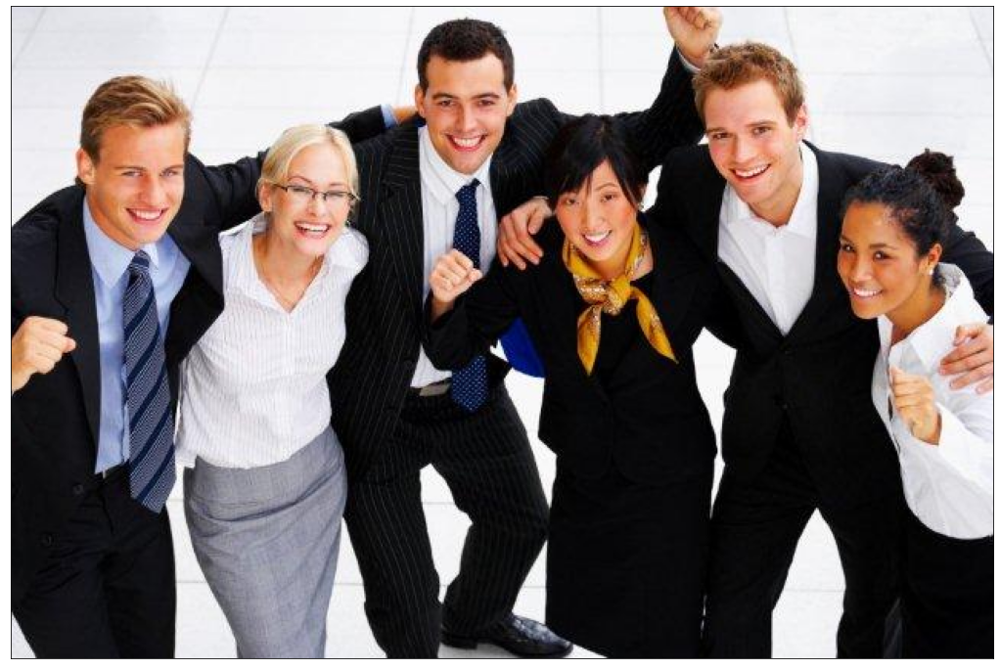

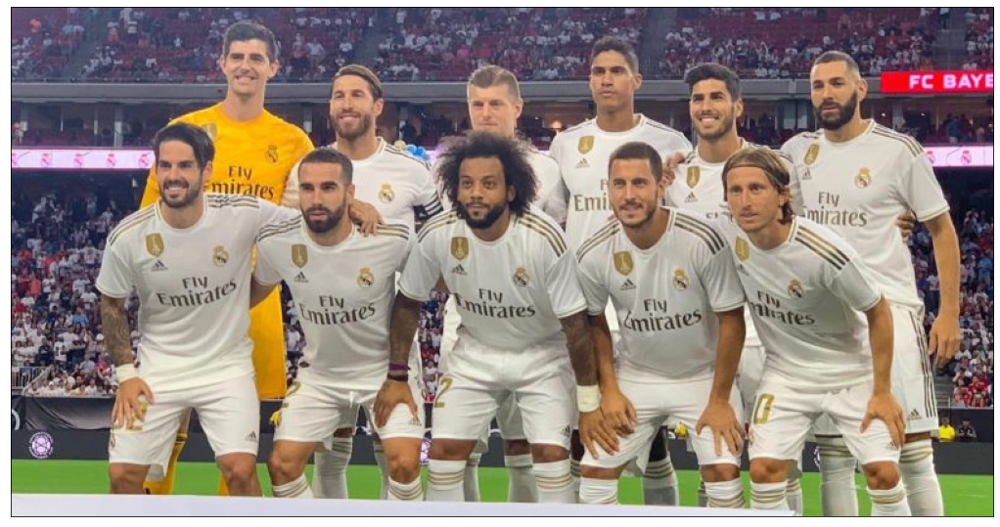

In [75]:
show_image(Foto_Trabajo())
show_image(Foto_Real())

In [99]:
def detect_face(image, scaleFactor, minNeighbors, minSize):
    # En caso de que se tenga un rostro en una imágen color gris
    image_gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    faces=fd.detect(image_gray,
                   scaleFactor=scaleFactor,
                   minNeighbors=minNeighbors,
                   minSize=minSize)

    for x, y, w, h in faces:
        # Detección de rostros en una imágen a color
        cv2.rectangle(image,(x,y),(x+w, y+h),(127, 255,0),3)

    show_image(image)
    

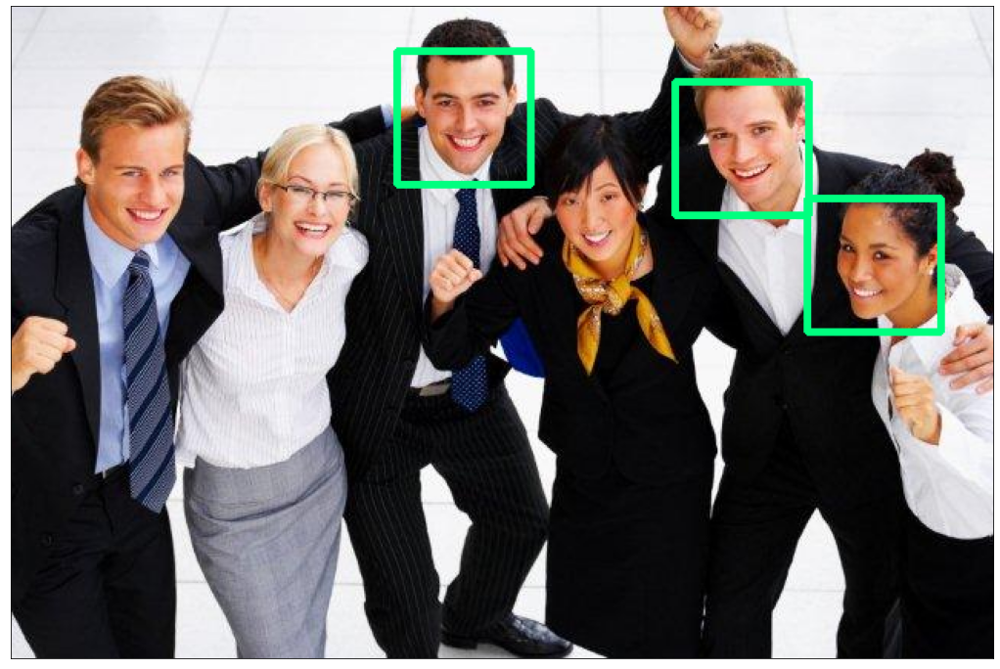

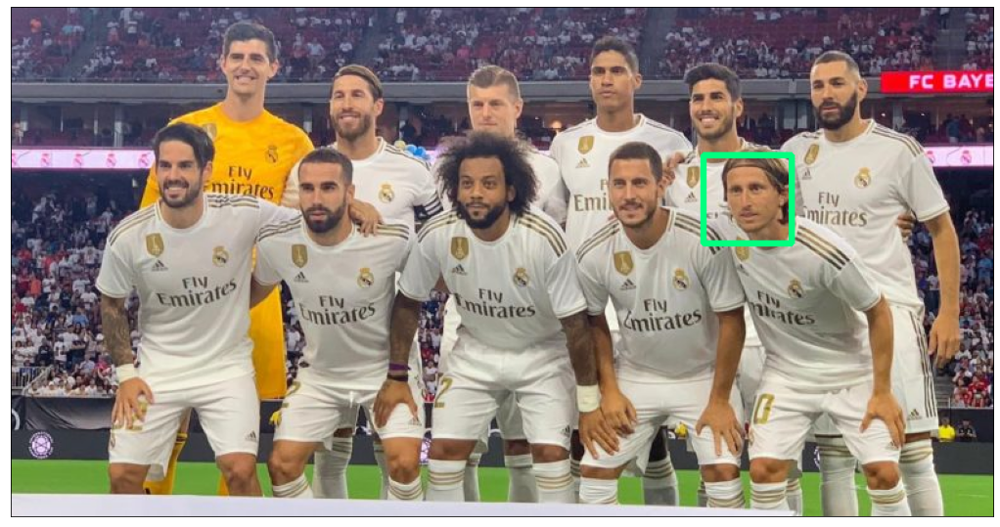

In [100]:
Empleados = Foto_Trabajo()

detect_face(image=Empleados, 
            scaleFactor=1.9, 
            minNeighbors=3, 
            minSize=(30,30))

Real_Madrid = Foto_Real()

detect_face(image=Real_Madrid, 
            scaleFactor=2.9, 
            minNeighbors=3, 
            minSize=(30,30))

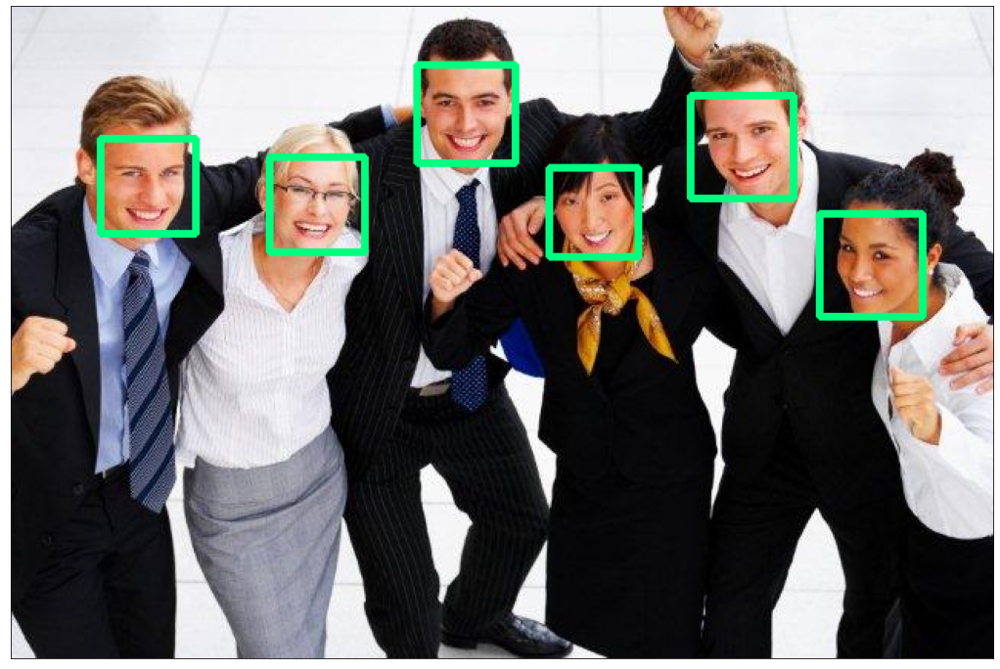

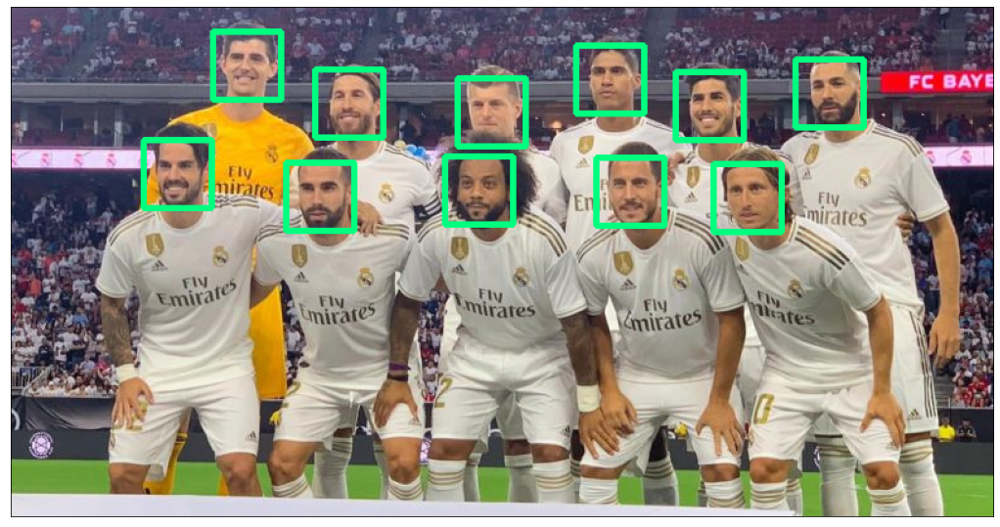

In [101]:
# Si se cambian los parámetros, cambia la cantidad de rostros visibles o encontrados

Empleados = Foto_Trabajo()
detect_face(image=Empleados, 
            scaleFactor=1.3, # Parámetros de escala
            minNeighbors=3, 
            minSize=(30,30))

Real_Madrid = Foto_Real()
detect_face(image=Real_Madrid, 
            scaleFactor=1.5, # Parámetros de escala
            minNeighbors=3, 
            minSize=(30,30))

## Creación de la clase para la base de datos LFW

In [115]:
class FetchLFW:
    def __init__(self, path):
        self.path=path
        
    # Se define la dimensión que tendrá la matriz con las imágenes # 
        
    def _initialize(self,dim):
        self.Dimension_Galeria=dim
        self.Numero_Imagenes=self.Dimension_Galeria*self.Dimension_Galeria
        
        Total_No_Imagenes=13233 # Cantidad de imágenes en la BD 
        self.Eleccion_Rostros_Aleatorios=np.arange(Total_No_Imagenes)
        np.random.shuffle(self.Eleccion_Rostros_Aleatorios)
        self.n_random_face_indexes=self.Eleccion_Rostros_Aleatorios[:self.Numero_Imagenes]
        
    def get_lfw_images(self,dim=5):
        
        self._initialize(dim)
        
        self.lfw_images=self._get_images()
        
        return self.lfw_images
        
    
    def _get_images(self):
        image_list=[]
        tar = tarfile.open(path, "r:gz")
        counter=0
        for tarinfo in tar:
            
            tar.extract(tarinfo.name)
            if tarinfo.name[-4:]==".jpg":
                if counter in self.n_random_face_indexes:
                    image=cv2.imread(tarinfo.name, cv2.IMREAD_COLOR)
                    image=cv2.resize(image,None,fx=0.4, fy=0.4, interpolation=cv2.INTER_AREA)
                    image_list.append(np.array(image))
                counter+=1
            if tarinfo.isdir():
                pass
            else:
                os.remove(tarinfo.name)
        tar.close()
        
        return np.array(image_list)

In [127]:
# Se carga la ruta donde se encuentra la base de datos en archivo comprimido #
path="D:/Proyecto_Mineria/Proyecto/Funneled/lfw-funneled.tgz"
fetchLFW=FetchLFW(path)

# Se establece la dimensión que tendrá la matriz #
dimension=15

# Se obtienen las imagenes de LFW #
images=fetchLFW.get_lfw_images(dim=dimension)
print("Las imágenes de LFW han sido obtenidas")

Las imágenes de LFW han sido obtenidas


In [128]:
#Imprimimos la forma como estará distribuida la matriz a usar #
print(images.shape)

(225, 100, 100, 3)


## Función para generar la galeria de imágenes

In [129]:
# Realizamos la creación de la matriz de imágenes correspondiente a las obtenidas según la dimensión establecida #
def get_photo_gallery():
    counter=0
    himages=[]
    vimages=[]
    for i in range(dimension):
        for j in range(dimension):
            
            himages.append(images[counter])
            counter+=1

        himage=np.hstack((himages))
        vimages.append(himage)
        himages=[]
    image_matrix=np.vstack((vimages))
    return image_matrix

## Galeria de Fotos

A partir de las imágenes que escogió la función de manera aleatoria y según la dimensión establecida, generamos una matriz con todas estas imágenes, de tal manera que parece una galeria de fotos.

photo_gallery:(1500, 1500, 3)


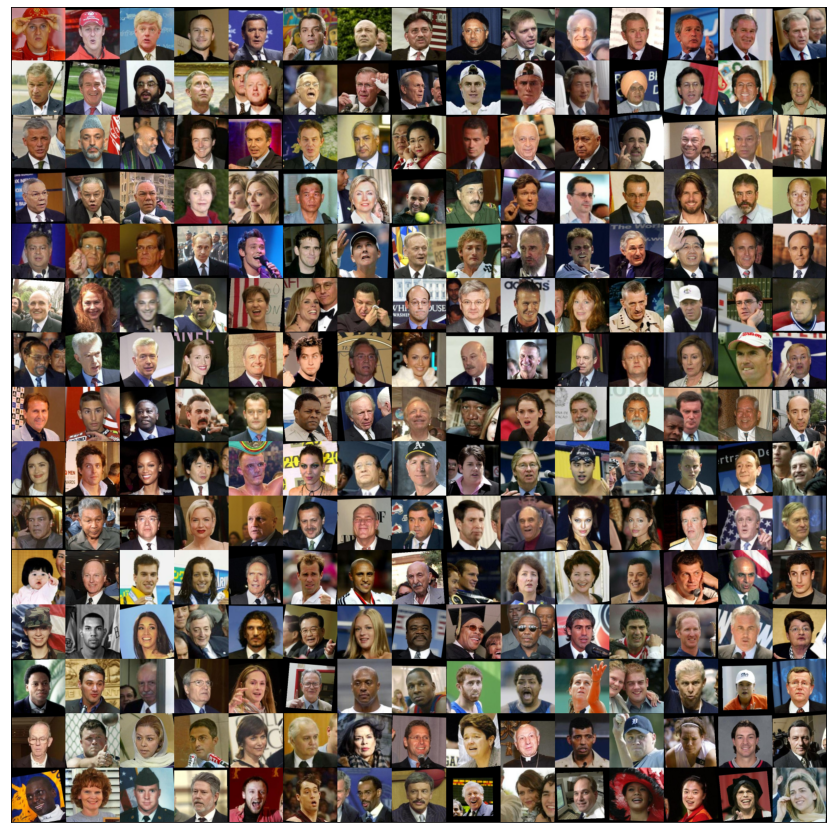

In [130]:
#Establecemos la galeria de fotos en forma de matriz #
photo_gallery=get_photo_gallery()
print("photo_gallery:{}".format(photo_gallery.shape))
show_image(photo_gallery)

## Detectar rostros en la base de datos

In [131]:
# Cargamos el código que permite la detección de rostros #
frontal_cascade_path="D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/data/haarcascades/haarcascade_frontalface_default.xml"
fd=FaceDetector(frontal_cascade_path) # Detector de rostros

# Empezamos en un total de 0 rostros escaneados y registrados #
face_counter=0

for image_org in images:
    
    # La función busca y analiza la galeria de fotos en busca de rostros definidos que pueda seleccionar #
    
    image_gray=cv2.cvtColor(image_org,cv2.COLOR_BGR2GRAY)
    faceRect=fd.detect(image_gray,
                       scaleFactor=1.1,
                       minNeighbors=5,
                       minSize=(30,30))
    
    # Se establece que si el algoritmo encuentra un rostro el cual este considere que está bien definido #
    # esta función encerrará dicha imágen en un recuadro, determinando el areá que comprende el rostro #
    
    first_detection=False
    for (x,y,w,h) in faceRect:
        if first_detection==False:
            face_counter+=1
            cv2.rectangle(image_org,(x,y),(x+w,y+h),(127,255,0),2)
            first_detection=True
        else:
            print("Second detection ignored in a image")
            
# Mostramos el total de imágenes que fueron escaneadas y el total que fueron reconocidas como rostros definidos #

print("{} images have been scaned".format(dimension*dimension))
print("{} faces have been detected".format(face_counter))

Second detection ignored in a image
Second detection ignored in a image
Second detection ignored in a image
225 images have been scaned
217 faces have been detected


## Mostramos la detección de rostros en formato de galeria

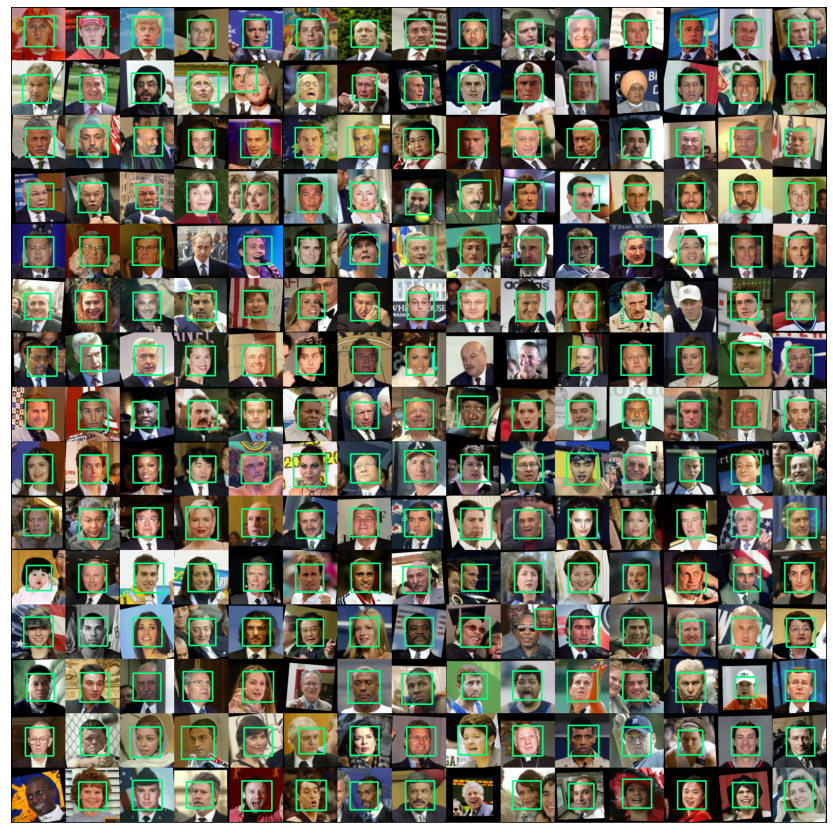

In [132]:
# Finalmente, se muestra la galeria de fotos con el encuadre de aquellas imágenes que el algoritmo reconoció e identificó claramente el rostro de la persona #
photo_gallery=get_photo_gallery()
show_image(photo_gallery)

Cabe aclarar que el algoritmo no considera aquellas imágenes en las cuales no se logre evidenciar en un gran porcentaje, los rasgos de la cara. No tiene en cuenta, aquellas imágenes que están obstruidas por objetos, sombras o elementos que perturben la correcta observación por parte del algoritmo. Así mismo, no considera aquellas imágenes que están de perfil o que está ocultando parte de su rostro. 

Por último, entre mayor sea la dimensión establecida por el usuario, habrá mayor cantidad de imágenes en la galeria de fotos y por lo tanto, el usuario no podrá apreciar en su totalidad la cantidad de imágenes encontradas.